# Applied Data Science Capstone Week 5 #

## London boroughs and Neighbourhoods ##
## Finding a good site for an authentic, exotic, Restaurant ##
### Leveraging FourSquare ###

**By Edward de Ryckman**

https://github.com/eddyholland<br>edward.deryckman@mac.com

For the IBM / Coursera Data Science Capstone <br>
This ipython notebook is in experimental mode. <br>
All errors are mine. File any bug reports to /dev/null

Still - I hope you enjoy it

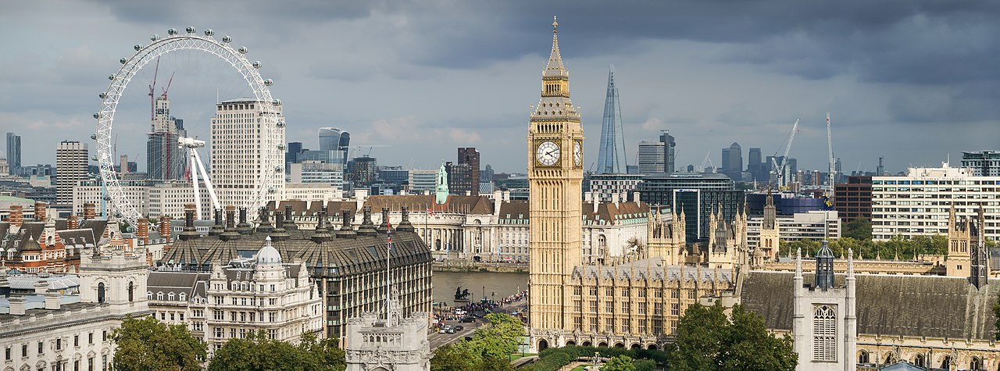

In [ ]:
# Setup
#!pip3 install bs4 beautifulsoup4 lxml html5lib pgeocode seaborn xlrd
import pandas as pd # library for data analsysis
import numpy as np # library to handle data in a vectorized manner
import bs4
from bs4 import BeautifulSoup
import urllib.request
import re  # real warriors do it with RegEx
import pgeocode # module to convert an address into latitude and longitude values
import requests
import matplotlib.cm as cm
import matplotlib.colors as colors
import folium
import matplotlib.pyplot as plt
import seaborn as sns
import json
import geojson

### Contents ###
1. Problem Statement - what is the Business Goal (business understanding)
2. Data Collection and Data Understanding
3. Data Preparation (data cleansing)
4. Exploratory Data Analysis and Methodology
5. Results Section
6. Discussion, Conclusion

# 1. Problem Statement #

### Business Understanding ###

3 Friends - *Athos, Portos and Aramis* - came to me to seek advice on what would be a good **location** to open an exotic Restaurant in **London**

There are several key factors necessary (but not sufficient) for success in the Restaurant business. Among them are **location**, **supply vs demand** (competition) and **popularity or reputation** (create a buzz). Those are the factors in scope (They are already managing the other factors).

Our goal here is to find, extract, load and cleanse the data, that will help us to make a **recommendation** based on facts (data-driven decision) as to:
* The most promising location(s) in London
* The most promising *cuisines* to promote<br>
For the purposes of this exercise, *London* is defined as the London postcode district (not the greater metropolitan area that includes surrounding counties).

We will be making extensive use of data from **Four Square** supplemented by other open source data like Wikipedia, TFL, ODI, London datastore, etc. 


## 1.b Background ##

### London ###
The London postcodes is an area covering 241 square miles (excluding the surrounding county areas in the wider metropolitan area), broadly organized as 8 *Postcode Areas* and 120 postcodes (post outcodes). The inner (City of London / Westminster) are the central or downtown (CBD) area, known to Transport for London (TFL) az 'Zone 1' and the outer postcodes are residential districts (generally in Zone 3, 4 or 5). See https://en.wikipedia.org/wiki/London and https://en.wikipedia.org/wiki/London_postal_district

London itself is a very important global financial center with a vibrant economy and a large ethnic or immigrant population (including myself) and very well served by a broad and deep range of Restaurants and other leisure and nighlife venues. It is multi-culural and multi-lingual and still an important world city of 8M people (although larger metropolis exist elsewhere). I've lived in London 20+ years.

**Data Sources**
Postcodes we will be scraping from https://en.wikipedia.org/wiki/London_postal_district possibly other Open-source data sources. <br>
For tube (metro) locations we will be scraping from www.tfl.gov.uk


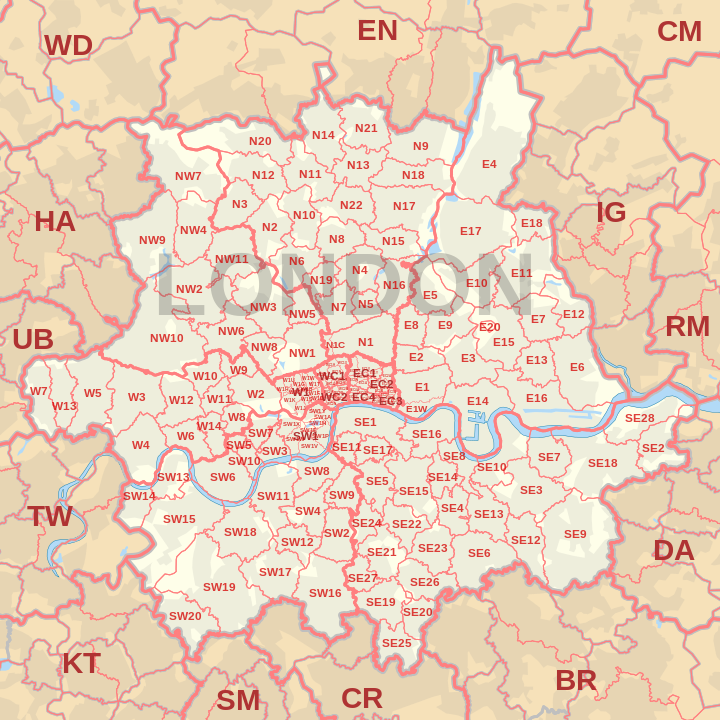<br>
**London post codes**: E, SE, SW, W, N, NW. WC is Westminster and EC is City. Other areas like TW, CR, BR, HA, EN, are outer londer boroughs (not in scope)<br>

### Restaurants ###

**Supply vs. Demand** and Competition. 

Athos, Portos and Aramis each have their own recommendation for the foreign **cuisine** they want to open the Restaurant with - e.g. Cuban or Mexican, Lebanese, Polish. Personally I like all of them.

We will want to look at the:
1) Prevalance of Restaurants in London (and by borough) of different cuisines - because if the market is already saturated in, for example, Indian or French restaurants, we don't want to compete in that space.
2) Likely demand for under-served cuisines using for example population demographics (ethnic origin) or some other indicator of preference.

The goal being to identify a *Demand* that is *Underserved* in a given *Area* i.e. with little head-to-head competition with established Restaurants (of the same / similar cuisine) that aready have a reputation / popularity. If our cusine is *novel* to the area, we have a unique value proposition to attract new diners.

**Location, Location, Location**

When opening a Restaurant (and this is true of many customer-facing businesses) the geographical *Location* is key to success. This is why we will be using geo-location data, both of each London postcode, and of existing (competitor) Restaurants. Bear in mind that in real life it would not be only the centroids of postcodes (or their .geojson bounding boxes) that is of interest here, but the siting of the restaurant - is it on a busy street with lots of footfall, where it can be seen - and also is the frontage attractive (kerb appeal).

We will also try to cross-reference with TFL tube data - is it close to a tube, is there much traffic flow.

**Buzz**

To create a *Buzz* we will have to rely not only on the old-school physical promotion of the Restuaurant but also *Social Media* such as having recommendations on **Four Square** as well as Fessbouc and paying for keywords on Google searches in our London area. Also levearging Twitter, Instagram, etc. Of course if the cook is excellent then word-of-mouth is invaluable.

## 2. Data Collection and Data Understanding ##

London PostCodes: **pdPostCodes**<br>
Location Data (Latitude, Longitude) for London Postcode: **pdPostCodes**<br>
Tube (TFL) Data - both Location (Latitude, Longitue) and also Footfall (entry- and exit flows): **pdTFL_Tube_Flows**<br>
FourSquare Data: **Lon_4sq_venues**<br>
Demographic Data from London Datastore - for Consumer expenditure on Restaurants: **pdConsumerWallet**<br>
GeoJSON bounding files for London Postcodes: **dPostCodeGJSON**

### London PostCodes ###
attribution: thanks to **Wikipedia.org**

In [ ]:
# First datasource: London postcode outcodes:
wiki_lon_pc_url = 'https://en.wikipedia.org/wiki/London_postal_district'

page = urllib.request.urlopen(wiki_lon_pc_url)

# parse the HTML from our URL into the BeautifulSoup parse tree format
soup = BeautifulSoup(page)

In [ ]:
# Inspection time (long - HTML)
#print(soup.prettify())
#long blob of HTML ....

In [ ]:
# List the tables, we need to extract specific tables ignoring others
right_table=soup.find_all('table', class_='wikitable')
print("count of tables: {}".format(len(right_table)))
right_table[0]

In [ ]:
Post_OCodes = pd.read_html(str(right_table[0]))
Post_OCodes[0]

### Data Wrangling ###
This data is not exactly in a good shape for us (there is **not** 1 table row per postcode, there is just list of postcodes)<br>
So we will have to iterate through the table rows and get all the distinct lines of text for the postcodes.

In [ ]:
## Parse our soup "right_table" for the list of Postcodes:
postcodes = []

for i in range(0, len(right_table)):   # there are several tables (3) in this wiki article
    
    # for each <table row> :
    for row in right_table[i].findAll('tr'):
        
        # list of <table data> cells
        cells=row.findAll('td')
        
        # matching cells:
        if len(cells)>=2:
            # here we split by html \n tag
            # lcodes is a list of codes
            lcodes = str(cells[-1]).split('<br/>')
            
            # here we cleanup html tags on our string: first list item and last list item
            clean = re.compile('<.*?>')
            lcodes[0] = re.sub(clean, '', lcodes[0])
            lcodes[-1] = re.sub(clean, '', lcodes[-1])
            
            # tokenize (split)
            for item in lcodes:
                postcodes.append(re.split('(\D+\d+)',item))
                ##print(re.split('(\D+\d+)',item))

print("len: {}".format(len(postcodes)))      

In [ ]:
# structur of postcodes[]
postcodes[0:5]
# postcodes[] is a list of tuples: null, postcode, label - not great. Needs cleanup

In [ ]:
# We have to tidy it a bit further (strip spaces) and cast it into a Pandas DataFrame:
# dataFrame
pdPostCodes = pd.DataFrame(columns=['Outcode','Neighbourhood'])

for litem in postcodes:
    code = litem[1].strip(' \t\n\r')
    label = litem[2].strip(' \t\n\r')
    # yeah we can ignore list-item[0] it is null
    
    row = {'Outcode':code, 'Neighbourhood': label}
    pdPostCodes = pdPostCodes.append(row, ignore_index=True)
    
pdPostCodes[-5:]

### Win ! ###
Now PostCode data is clean and in a pandas DataFrame.<br>
Next tasks:<br>
1. Append the geospatial Latitue, Longitude of each postcode (the 'centroid') - *Thanks and credits to pgeocode library*
2. Get a list of TFL tube stations and their locations (Lat, Long)
3. Optionally we may enrich with further datasource (like Crime statistics, whatever)

In [ ]:
nomi = pgeocode.Nominatim('gb')

df = nomi.query_postal_code('SW6')
print('TestSW6 coordinates : {} : {}'.format(df['latitude'], df['longitude']))

In [ ]:
# Exend our dataframe (make space)
pdPostCodes[['latitude', 'longitude']] = pd.DataFrame([[np.nan, np.nan]])

# Populate our dataframe with the 2 extra columns
for row in pdPostCodes.itertuples():  
    df = nomi.query_postal_code(row[1])

    pdPostCodes.at[row[0], 'latitude'] = df['latitude']
    pdPostCodes.at[row[0], 'longitude'] = df['longitude']
    
pdPostCodes.set_index('Outcode', inplace = True)

pdPostCodes[-5:]

In [ ]:
pdPostCodes[pdPostCodes.isna().any(axis=1)]

In [ ]:
# Fix missing value for N9 
pdPostCodes.at['N9','latitude'] = 51.6285
pdPostCodes.at['N9','longitude'] = -0.0580

#### Yay! win ####

### Tube Data: TFL ###
Now we try to get TFL Tube stations and locations

In [ ]:
# This TFL data was requested under Freedom of Information regulations and posted here in the open domain in 'What do they Know'
pdTFL_tubes = pd.read_csv('https://www.whatdotheyknow.com/request/512947/response/1238210/attach/3/Stations%2020180921.csv.txt?cookie_passthrough=1')

print('Data downloaded!')
print('len : {}'.format(len(pdTFL_tubes)))
pdTFL_tubes.head()

In [ ]:
pdTFL_tubes.drop(['OBJECTID','EASTING','NORTHING'], axis = 1, inplace=True) # don't need these (Easting is OS equivalent of x)
pdTFL_tubes.rename(columns = {'x':'longitude', 'y':'latitude'}, inplace = True)  # we do need these : y is latitude

pdTFL_tubes = pdTFL_tubes.dropna()  # drop the 200 or so observations that are not part of a London Underground line (i.e. Rail, Overground etc)
print(pdTFL_tubes.shape)
pdTFL_tubes[0:5]

### FourSquare Data ###
**Venues**

#### Define Foursquare Credentials and Version


In [ ]:
CLIENT_ID = 'AB5AMGTIZ3MP3WS1EZPNW2XYO3G4ACCWZOZEHUWK4SSRXJH4' # my Foursquare ID
CLIENT_SECRET = 'xxx' # my Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 250 # A default Foursquare API limit value

print('My credentails:')
print('CLIENT_ID: ' + CLIENT_ID)

Function that will repeat calls on FourSquare API for venues matching our query and append to our dataFrame

In [ ]:
def getNearbyVenues(neighbourhoods, codes, latitudes, longitudes, radius):

    query='Food'
    venues_list=[]
    for neighbourhood, pcode, lat, lng, radius in zip(neighbourhoods, codes, latitudes, longitudes, radius):
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&query={}&radius={}&limit={}'.format(
        #url = 'https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&ll={},{}&query={}&radius={}&limit={}'.format(
            CLIENT_ID,       CLIENT_SECRET,   
            VERSION, 
            lat,     lng,             
            query,
            radius,
            LIMIT)
        #print(url)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            pcode,
            neighbourhood, 
            lat, 
            lng, 
            v['venue']['id'], 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'], 
            v['venue']['location'].get('postalCode', code),
            v['venue']['categories'][0]['name']) for v in results])
        

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Outcode',
                  'Neighbourhood', 
                  'latitude', 
                  'longitude', 
                  'Venue_id',
                  'Venue', 
                  'Venue_latitude', 
                  'Venue_longitude', 
                  'Venue_Postcode',
                  'Venue_category']
    
    return(nearby_venues)

In [458]:
# Enrich with this dataset - very roughly, how large the radius of the postcode is (Sml, Med, Large)
pdPostCodesizes = pd.read_csv('postcodedatasize.csv')
pdPostCodesizes.drop(['Neighbourhood'], axis = 1, inplace=True)

# Inner join to add new column to my dataframe:
pdPostCodes = pd.merge(pdPostCodes, pdPostCodesizes, how='inner', on='Outcode')

In [459]:
pdPostCodes.tail()

,Outcode,Neighbourhood,latitude,longitude,Radius_x,Radius_y
115,W12,Shepherds Bush,51.5050,-0.221100,1500.0,1500
116,W13,West Ealing,51.5122,-0.311625,1500.0,1500
117,W14,West Kensington,51.5019,-0.217980,1500.0,1500
118,WC1,"WC1 Westminster - Bloomsbury, High Holborn",51.5333,-0.122300,600.0,600
119,WC2,"WC2 City of Westminster, Strand",51.5175,-0.123382,600.0,600


In [ ]:
Lon_4sq_venues = getNearbyVenues(neighbourhoods= pdPostCodes['Neighbourhood'],
                             codes= pdPostCodes.index.values,
                             latitudes= pdPostCodes['latitude'],
                             longitudes= pdPostCodes['longitude'],
                             radius=pdPostCodes['Radius'])
print(Lon_4sq_venues.shape)

In [461]:
Lon_4sq_venues.head()

,Outcode,Neighbourhood,latitude,longitude,Venue_id,Venue,Venue_latitude,Venue_longitude,Venue_Postcode,Venue_category,Count,Category_Grouping
0,E1,E1 Head - Whitechapel,51.5,-0.061773,4e04d8b97d8b58ba0dcd50fc,Smith's,51.504390,-0.066523,E1W 1NJ,Seafood Restaurant,15.0,Seafood Restaurant
1,E1,E1 Head - Whitechapel,51.5,-0.061773,4bc07776b492d13a5f42a460,Turk's Head Cafe,51.504232,-0.061209,E1 W 2,Breakfast Spot,66.0,Breakfast Spot
2,E1,E1 Head - Whitechapel,51.5,-0.061773,4dd01553ae603b786d57e761,Laksha Bay,51.505564,-0.058122,E1W 2RW,Indian Restaurant,169.0,Indian Restaurant
3,E1,E1 Head - Whitechapel,51.5,-0.061773,4ac518dcf964a52055a920e3,River View Restaurant,51.505563,-0.054023,E1W 3TU,Chinese Restaurant,98.0,Chinese Restaurant
4,E1,E1 Head - Whitechapel,51.5,-0.061773,4cb982094495721e28b84a7a,Pumblechook's,51.507215,-0.067661,E1W 1YY,Café,Cafe,Cafe


Let's check out our dataframe of **Venues** and if data quality is good<br>
Notice for later the so-called *'Head District'*

In [ ]:
Lon_4sq_venues.groupby('Neighbourhood').count().sort_values('Venue', ascending=False).head(10)

In [ ]:
df_categories = Lon_4sq_venues.groupby('Venue_category').count().sort_values('Venue', ascending=False)
print("len: {}".format(len(df_categories)))
print("top ten categories:")
df_categories[0:10]

### GeoJSON bounding polygons for London postcodes ###
Let's get some .geojson bounding polygons for all our postcodes<br>
This data was forked from https://github.com/missinglink/uk-postcode-polygons all credit to him.<br>
We pulled 7 .geojson files for London postcodes into this repo. 

In [ ]:
featurelist = []

PostCodeAreas = ['SE','SW','W','NW','N','E','EC','WC']
for area in PostCodeAreas:
    with open(area + '.geojson') as f:
        data = json.load(f)
        d1 = data['features']
        for postcode in d1:
            #print(postcode['properties']['name'])
            featurelist.append(postcode)

dPostCodeGJSON = {'type': 'FeatureCollection', 'features' : featurelist}

In [ ]:
#better, faster, cleaner data:
featurelist = []

with open('LondonPostCodes.geojson', 'r') as readf:
    data = json.load(readf)
    d1 = data['features']
    for postcode in d1:
        #print(postcode['properties']['name'])
        featurelist.append(postcode)

dPostCodeGJSON = {'type': 'FeatureCollection', 'features' : featurelist}

In [463]:
dPostCodeGJSON.keys()

dict_keys(['type', 'features'])

In [464]:
dPostCodeGJSON['features'][0].keys()

dict_keys(['type', 'geometry', 'properties'])

In [465]:
dPostCodeGJSON['features'][0]['properties']

{'name': 'SE1',
 'styleUrl': '#SE',
 'styleHash': '-1b95e2c4',
 'description': 'SE1 postcode district',
 'fill': '#00ffff',
 'fill-opacity': 0.4980392156862745}

I am hoping to use it later in a Folium map, perhaps a Chloropleth. <br>
*geometry* is a set of coordinates for polygon (quite a long list)

### LUL Tube Flows data ###
This data was pulled from **London DataStore** here:<br>
https://data.london.gov.uk/dataset/london-underground-performance-reports <br>
and is TFL open source data. I only have flows to 2017<br>
We have the average daily Entry- and Exit- flows on weekdays, Saturday, Sunday, and total for the year. Per Station <br>

In [ ]:
TFL_Tube_Flows = "https://data.london.gov.uk/download/london-underground-performance-reports/b6ab04fc-9062-4291-b514-7fa218073b4c/multi-year-station-entry-and-exit-figures.xls"

urllib.request.urlretrieve(TFL_Tube_Flows, "TFL_multi-year-station-entry-and-exit-figures.xls")  # For Python 3

In [ ]:
pdTFL_Tube_Flows = pd.read_excel('TFL_multi-year-station-entry-and-exit-figures.xls', 
                                 sheet_name = 1, # Latest year only please (it's 2017 Entry & Exit)
                                 usecols = "A:C,E:K", # columns we care: index, category, years 2021-2030
                                 skiprows = 6)

In [ ]:
pdTFL_Tube_Flows.head(5)

In [ ]:
pdTFL_Tube_Flows.rename(columns = {'Weekday.1':'Weekday_ex', 'Saturday.1':'Saturday_ex', 'Sunday.1':'Sunday_ex'}, inplace = True)  # we do need these : y is latitude
pdTFL_Tube_Flows.dropna(inplace = True)
print(pdTFL_Tube_Flows.shape)
pdTFL_Tube_Flows.tail(5)

### Consumer Expenditure Data ###
This data is sourced from **London DataStore** here:<br>
https://data.london.gov.uk/dataset/london-consumer-expenditure-estimates-2011-2036<br>
And I chose it because it has a breakdown of Consumer spending on **Restaurants and Caffees** and a 10-year forward looking projection of those values. Per Postcode.

In [ ]:
LonConsumerExpendEst_Data = "https://data.london.gov.uk/download/london-consumer-expenditure-estimates-2011-2036/322f914f-5ca0-4ae2-8d25-fc8443f9e6e8/aggregated-postal-base-greater-london.xls"

urllib.request.urlretrieve(LonConsumerExpendEst_Data, "LonConsumerExpendEst_Data.xls")  # For Python 3


In [ ]:
dictConsumerWallet = pd.read_excel('LonConsumerExpendEst_Data.xls', 
                                 sheet_name = [1,3,4,5,6,7,8,9,10,11,12,13,17,18,19,21,22,23,24,25,26,27,29,30,31,32], # Boroughs we care about (with inner london postcodes) - by inspection
                                 usecols = "A,B,Y:AH", # columns we care: index, category, years 2021-2030
                                 skiprows = 3)

In [ ]:
dictConsumerWallet[1][dictConsumerWallet[1]['Sector'] == 'Restaurants and Caffees'].head(5)

In [ ]:
pdConsumerWallet = pd.DataFrame(columns = dictConsumerWallet[1].columns )

## 3. Data Preparation / Cleansing ##


### Interim Findings ###
1. We have 6,100+ venues in London of type "Food"
2. I fail to find (in FourSquare) any venues for a few postcodes
3. There are duplicate Venues in FourSquare dataframe because the search returns matches within a given (say 1000m) radius, and these circles overlap in central london - leading to double-counting.
4. I have error in the Key value "Head District" which needs correcting in **pdPostCodes**. There are **10** head districts and they *should* each have distinct neighbourhood names, and anyway their index (Outcode) was different. We can correct for this (data cleaning)
5. The ConsumerWallet dataset, is at 1 level of granularity too deep and will need to be aggregated up to Post Outcodes.

In [ ]:
# Strip the venues which are duplicated (appear in multiple PostCode searches) - keep only the one that matches the Postcode
for row_tuple in Lon_4sq_venues.itertuples():
    venue_outcode = row_tuple.Venue_Postcode.strip(' \t\n\r')
    venue_outcode = re.split('(\D+\d+)', venue_outcode)
    #print(row_tuple)
    try:

        if venue_outcode[1] != row_tuple.Outcode:
            #print("dropping: {}, {}, {}, {}".format(row_tuple.Outcode, row_tuple.Venue_Postcode, venue_outcode, row_tuple.Venue))
            Lon_4sq_venues.drop(row_tuple.Index, inplace = True)
        else:
            #keep
            pass

    except IndexError:
        # not nice but we drop these bad data anyway.
        Lon_4sq_venues.drop(row_tuple.Index, inplace = True)
    


In [467]:
Lon_4sq_venues.shape

(2904, 12)

But only 2,900 distinct venues though....

#### Clean the PostCode data ####

In [ ]:
pdPostCodes[pdPostCodes['Neighbourhood']=='Head district']

In [ ]:
pdPostCodes.set_index('Outcode', inplace=True)

In [ ]:
# corrections (can't have 10 head districts, give them more distinctive names)
pdPostCodes.at['E1','Neighbourhood'] = 'E1 Head - Whitechapel'
pdPostCodes.at['EC1','Neighbourhood'] = 'EC1 City - Clerkenwell, Finsbury'
pdPostCodes.at['N1','Neighbourhood'] = 'N1 Head - Kings Cross, Islington, Hoxton'
pdPostCodes.at['NW1','Neighbourhood'] = 'NW1 - Marylebone, Regents Park, Baker Street'
pdPostCodes.at['SE1','Neighbourhood'] = 'SE1 Head - South Bank, Soutwark'
pdPostCodes.at['SW1','Neighbourhood'] = 'SW1 - Whitehall, Parliament, Buckingham Palace'
pdPostCodes.at['SW11','Neighbourhood'] = 'SW11 - Battersea' 
pdPostCodes.at['W1','Neighbourhood'] = 'W1 Head - Westminster, Soho, Mayfair' 
pdPostCodes.at['W2','Neighbourhood'] = 'W2 - Paddington, Hyde Park'
pdPostCodes.at['WC1','Neighbourhood'] = 'WC1 Westminster - Bloomsbury, High Holborn'
pdPostCodes.at['WC2','Neighbourhood'] = 'WC2 City of Westminster, Strand'

In [ ]:
pdPostCodes[pdPostCodes['Neighbourhood']=='Head district']

In [469]:
pdPostCodes.shape

(120, 6)

## 4. Exploratory Data Analysis and Methodology ##
### Includes Graphs and Maps ###

#### Lon_4sq_venues ####
Which Postcodes have the most "Food" venues? <br>
Which Venue Categories are the most common?

In [470]:
Lon_4sq_venues.describe(include = 'all')

,Outcode,Neighbourhood,latitude,longitude,Venue_id,Venue,Venue_latitude,Venue_longitude,Venue_Postcode,Venue_category,Count,Category_Grouping
count,2904,2904,2904.000000,2904.000000,2904,2904,2904.000000,2904.000000,2904,2904,2904,2904
unique,113,113,NaN,NaN,2904,2335,NaN,NaN,1997,108,48,59
top,N1,"N1 Head - Kings Cross, Islington, Hoxton",NaN,NaN,55e0c771498e34b61249f6d8,Greggs,NaN,NaN,SE5 8TR,Café,Cafe,Cafe
freq,87,87,NaN,NaN,1,41,NaN,NaN,10,443,443,443
mean,NaN,NaN,51.515192,-0.121674,NaN,NaN,51.515155,-0.122613,NaN,NaN,NaN,NaN
std,NaN,NaN,0.050769,0.084287,NaN,NaN,0.050658,0.085026,NaN,NaN,NaN,NaN
min,NaN,NaN,51.399400,-0.335900,NaN,NaN,51.386742,-0.339348,NaN,NaN,NaN,NaN
25%,NaN,NaN,51.481200,-0.188645,NaN,NaN,51.483890,-0.188229,NaN,NaN,NaN,NaN
50%,NaN,NaN,51.511200,-0.116700,NaN,NaN,51.510047,-0.121872,NaN,NaN,NaN,NaN
75%,NaN,NaN,51.547100,-0.062900,NaN,NaN,51.547406,-0.067550,NaN,NaN,NaN,NaN


<AxesSubplot:ylabel='Frequency'>

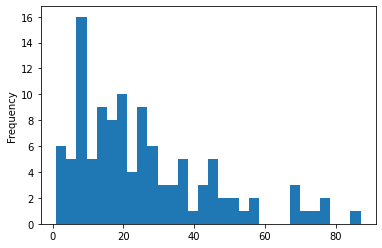

In [471]:
Lon_4sq_venues.Outcode.value_counts().plot.hist(bins = 30)
# frequency distribution, of the value counts.

Postcodes with most venues? <br>
Postcodes with least venues?

In [472]:
Lon_4sq_venues.groupby('Neighbourhood').count().sort_values('Venue', ascending=False).head(10)

,Outcode,latitude,longitude,Venue_id,Venue,Venue_latitude,Venue_longitude,Venue_Postcode,Venue_category,Count,Category_Grouping
Neighbourhood,,,,,,,,,,,
"N1 Head - Kings Cross, Islington, Hoxton",87,87,87,87,87,87,87,87,87,87,87
Poplar,78,78,78,78,78,78,78,78,78,78,78
South Kensington,78,78,78,78,78,78,78,78,78,78,78
"EC1 City - Clerkenwell, Finsbury",75,75,75,75,75,75,75,75,75,75,75
Stoke Newington,70,70,70,70,70,70,70,70,70,70,70
Chiswick,69,69,69,69,69,69,69,69,69,69,69
"SE1 Head - South Bank, Soutwark",69,69,69,69,69,69,69,69,69,69,69
"NW1 - Marylebone, Regents Park, Baker Street",67,67,67,67,67,67,67,67,67,67,67
"SW1 - Whitehall, Parliament, Buckingham Palace",58,58,58,58,58,58,58,58,58,58,58


In [473]:
Lon_4sq_venues.groupby('Neighbourhood').count().sort_values('Venue', ascending=False).tail(10)

,Outcode,latitude,longitude,Venue_id,Venue,Venue_latitude,Venue_longitude,Venue_Postcode,Venue_category,Count,Category_Grouping
Neighbourhood,,,,,,,,,,,
Stockwell,6,6,6,6,6,6,6,6,6,6,6
South Norwood,6,6,6,6,6,6,6,6,6,6,6
Hendon,6,6,6,6,6,6,6,6,6,6,6
New Southgate,5,5,5,5,5,5,5,5,5,5,5
Thamesmead,3,3,3,3,3,3,3,3,3,3,3
East Ham,3,3,3,3,3,3,3,3,3,3,3
Plaistow,2,2,2,2,2,2,2,2,2,2,2
Brixton,2,2,2,2,2,2,2,2,2,2,2
Holloway,2,2,2,2,2,2,2,2,2,2,2


Venue Categories which are most frequent?<br>
Venue Categories which are least frequent?

<AxesSubplot:ylabel='Frequency'>

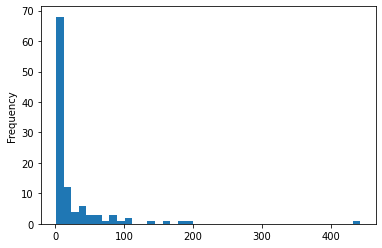

In [474]:
Lon_4sq_venues.Venue_category.value_counts().plot.hist(bins = 40)

In [475]:
Lon_4sq_venues.groupby('Venue_category').count().sort_values('Venue', ascending=False).head(10)

,Outcode,Neighbourhood,latitude,longitude,Venue_id,Venue,Venue_latitude,Venue_longitude,Venue_Postcode,Count,Category_Grouping
Venue_category,,,,,,,,,,,
Café,443,443,443,443,443,443,443,443,443,443,443
Italian Restaurant,197,197,197,197,197,197,197,197,197,197,197
Pizza Place,179,179,179,179,179,179,179,179,179,179,179
Bakery,161,161,161,161,161,161,161,161,161,161,161
Indian Restaurant,136,136,136,136,136,136,136,136,136,136,136
Fast Food Restaurant,107,107,107,107,107,107,107,107,107,107,107
Sandwich Place,104,104,104,104,104,104,104,104,104,104,104
Restaurant,96,96,96,96,96,96,96,96,96,96,96
Chinese Restaurant,82,82,82,82,82,82,82,82,82,82,82


In [476]:
Lon_4sq_venues.groupby('Venue_category').count().sort_values('Venue', ascending=False).tail(10)

,Outcode,Neighbourhood,latitude,longitude,Venue_id,Venue,Venue_latitude,Venue_longitude,Venue_Postcode,Count,Category_Grouping
Venue_category,,,,,,,,,,,
Shabu-Shabu Restaurant,1,1,1,1,1,1,1,1,1,1,1
German Restaurant,1,1,1,1,1,1,1,1,1,1,1
Scandinavian Restaurant,1,1,1,1,1,1,1,1,1,1,1
Gluten-free Restaurant,1,1,1,1,1,1,1,1,1,1,1
Halal Restaurant,1,1,1,1,1,1,1,1,1,1,1
Romanian Restaurant,1,1,1,1,1,1,1,1,1,1,1
Hot Dog Joint,1,1,1,1,1,1,1,1,1,1,1
Israeli Restaurant,1,1,1,1,1,1,1,1,1,1,1
Poke Place,1,1,1,1,1,1,1,1,1,1,1


**Venue Category** data is too granular, there are outliers of 1, which should be aggregated back into the main categories<br>
Like for example Shabu-Shabu, Sushi, etc (Japanese) or Xinjiang, Dim Sum, etc (Chinese)<br>
or Bengali, South Indian, etc (Indian), Tapas (Spanish)<br>
I will do this in next round of data cleanup. 

In [ ]:
category_aggregation = pd.read_csv('Lon_venue_aggr_category.csv')

In [ ]:
category_aggregation.tail()

In [ ]:
Lon_4sq_venues.head()

In [ ]:
Lon_4sq_venues = pd.merge(Lon_4sq_venues, category_aggregation, how='left', on='Venue_category')

In [ ]:
Lon_4sq_venues[Lon_4sq_venues['Category_Grouping'].isna()]['Venue_category'].value_counts()

In [ ]:
Lon_4sq_venues.fillna('Cafe', inplace=True)

In [477]:
Lon_4sq_venues.groupby('Category_Grouping').count().sort_values('Venue', ascending=False).head(12)

,Outcode,Neighbourhood,latitude,longitude,Venue_id,Venue,Venue_latitude,Venue_longitude,Venue_Postcode,Venue_category,Count
Category_Grouping,,,,,,,,,,,
Cafe,443,443,443,443,443,443,443,443,443,443,443
Italian Restaurant,197,197,197,197,197,197,197,197,197,197,197
Pizza Place,179,179,179,179,179,179,179,179,179,179,179
Bakery,166,166,166,166,166,166,166,166,166,166,166
Indian Restaurant,149,149,149,149,149,149,149,149,149,149,149
"Steakhouse, Burger Joint",110,110,110,110,110,110,110,110,110,110,110
Fast Food Restaurant,107,107,107,107,107,107,107,107,107,107,107
Sandwich Place,104,104,104,104,104,104,104,104,104,104,104
Japanese Restaurant,102,102,102,102,102,102,102,102,102,102,102


In [478]:
Lon_4sq_venues.groupby('Category_Grouping').count().sort_values('Venue', ascending=False).tail(12)

,Outcode,Neighbourhood,latitude,longitude,Venue_id,Venue,Venue_latitude,Venue_longitude,Venue_Postcode,Venue_category,Count
Category_Grouping,,,,,,,,,,,
Polish Restaurant,6,6,6,6,6,6,6,6,6,6,6
Moroccan Restaurant,6,6,6,6,6,6,6,6,6,6,6
Food Court,6,6,6,6,6,6,6,6,6,6,6
Ethiopian Restaurant,5,5,5,5,5,5,5,5,5,5,5
Irish Pub,4,4,4,4,4,4,4,4,4,4,4
"German, Austrian Restaurant",3,3,3,3,3,3,3,3,3,3,3
Israeli Restaurant,2,2,2,2,2,2,2,2,2,2,2
Poke Place,1,1,1,1,1,1,1,1,1,1,1
Scandinavian Restaurant,1,1,1,1,1,1,1,1,1,1,1


Better (60 Category groups)

#### pdPostCodes and dPostCodeGJSON ####
Map our Postcodes with their boundaries<br>

In [ ]:
# set color scheme for the clusters
colors_array = cm.rainbow(np.linspace(0, 1, 30))
rainbow = [colors.rgb2hex(i) for i in colors_array]

In [ ]:
dfShading = pd.DataFrame(Lon_4sq_venues['Outcode'].value_counts())
dfShading.reset_index(inplace = True)

In [479]:
dfShading.head()

,index,Outcode
0,N1,87
1,E14,78
2,SW7,78
3,EC1,75
4,N16,70


In [480]:
pdPostCodes.head()

,Outcode,Neighbourhood,latitude,longitude,Radius_x,Radius_y
0,E1,E1 Head - Whitechapel,51.5000,-0.061773,900.0,900
1,E2,Bethnal Green,51.5500,-0.055525,600.0,600
2,E3,Bow,51.5250,-0.026571,1500.0,1500
3,E4,Chingford,51.6303,0.000500,2500.0,2500
4,E5,Clapton,51.5640,-0.054517,600.0,600


In [489]:
map_Lon = folium.Map(location=[51.51, -0.10], zoom_start=11)


map_Lon.choropleth(
    geo_data=dPostCodeGJSON,
    data=dfShading,
    columns=['index', 'Outcode'],
    key_on='feature.properties.name',
    fill_color='YlOrRd', nan_fill_color='purple',
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='London Postcodes shaded by 4Square venue counts',
)
    
map_Lon

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/folium/folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


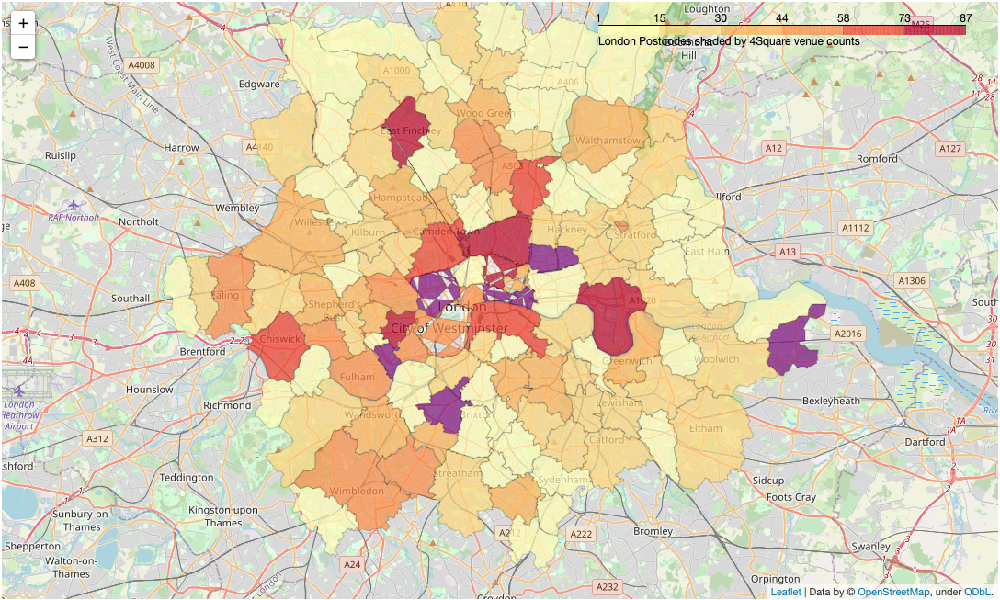

#### LUL Tube Stations ####


In [481]:
pdTFL_tubes.shape

(269, 8)

In [482]:
pdTFL_tubes.head()

,FID,NAME,LINES,NETWORK,Zone,longitude,latitude,million
0,0,Temple,"District, Circle",London Underground,1,-0.112644,51.510474,8.946533
1,1,Blackfriars,"District, Circle",London Underground,1,-0.102020,51.511114,14.825714
2,2,Mansion House,"District, Circle",London Underground,1,-0.092495,51.511306,6.405554
3,3,Cannon Street,"District, Circle",London Underground,1,-0.088801,51.510963,9.388205
5,5,Tower Hill,"District, Circle",London Underground,1,-0.074914,51.509434,21.032731


In [483]:
pdTFL_Tube_Flows.shape

(268, 10)

In [484]:
pdTFL_Tube_Flows.head()

,nlc,NAME,Borough,Weekday,Saturday,Sunday,Weekday_ex,Saturday_ex,Sunday_ex,million
0,500.0,Acton Town,Ealing,9531.0,6716.0,4744.0,9382.0,6617.0,4785.0,6.040516
1,502.0,Aldgate,City of London,15080.0,4397.0,3261.0,16023.0,5909.0,4230.0,8.846940
2,503.0,Aldgate East,Tower Hamlets,22327.0,16166.0,13323.0,21071.0,13893.0,11347.0,13.998292
3,505.0,Alperton,Brent,4495.0,3279.0,2345.0,5081.0,3392.0,2445.0,3.052230
4,506.0,Amersham,Chiltern,3848.0,1876.0,1232.0,4025.0,1797.0,1121.0,2.321692


In [ ]:
pdTFL_Tube_Flows.rename(columns = {'Station':'NAME'}, inplace = True)

In [ ]:
pdTFL_tubes[~pdTFL_tubes['NAME'].isin(pdTFL_Tube_Flows['NAME'])]

In [ ]:
pdTFL_Tube_Flows[~pdTFL_Tube_Flows['NAME'].isin(pdTFL_tubes['NAME'])]

In [ ]:
### Data Cleanup
pdTFL_Tube_Flows.loc[69,'NAME'] = 'Edgware Road (Bakerloo)'
pdTFL_Tube_Flows.loc[70,'NAME'] = 'Edgware Road (Circle Line)'
pdTFL_Tube_Flows.loc[94,'NAME'] = 'Hammersmith (Dist&Picc Line)'
pdTFL_Tube_Flows.loc[95,'NAME'] = 'Hammersmith (H&C Line)'
pdTFL_Tube_Flows.loc[104,'NAME'] = 'Heathrow Terminals 1-2-3'
pdTFL_Tube_Flows.loc[196,'NAME'] = "Shepherd's Bush"
pdTFL_Tube_Flows.loc[197,'NAME'] = "Shepherd's Bush Market"
pdTFL_Tube_Flows.loc[11,'NAME'] = "Bank"


In [485]:
pdTFL_Tube_Flows.shape

(268, 10)

### Tube Map ###

In [ ]:
pdTFL_tubes = pd.merge(pdTFL_tubes, pdTFL_Tube_Flows[['NAME','million']], how='left', on='NAME')

In [486]:
pdTFL_tubes.head(3)

,FID,NAME,LINES,NETWORK,Zone,longitude,latitude,million
0,0,Temple,"District, Circle",London Underground,1,-0.112644,51.510474,8.946533
1,1,Blackfriars,"District, Circle",London Underground,1,-0.102020,51.511114,14.825714
2,2,Mansion House,"District, Circle",London Underground,1,-0.092495,51.511306,6.405554


<AxesSubplot:ylabel='Frequency'>

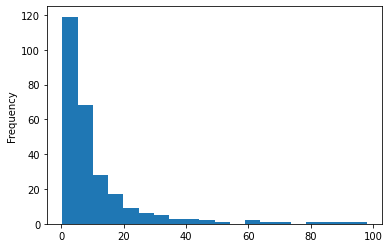

In [487]:
pdTFL_tubes['million'].plot.hist(bins = 20)

In [ ]:
pdTFL_tubes.dropna(inplace = True)

In [490]:
map_LUL = folium.Map(location=[51.51, -0.12], zoom_start=13)

In [491]:
for lat, lng, name, size in zip(pdTFL_tubes['latitude'], pdTFL_tubes['longitude'], pdTFL_tubes['NAME'], pdTFL_tubes['million']):
    label = '{}, {} M'.format(name, np.round(size,2))
    label = folium.Popup(label, parse_html=True)
    
    folium.CircleMarker(
        [lat, lng],
        radius=int(3*np.sqrt(size)), # define how big you want the circle markers to be. 
                                     # I use sq. root to scale bubble area by millions
        popup = label,
        color='black',
        fill=True,
        fill_color='blue',
        fill_opacity=0.3
    ).add_to(map_LUL)

map_LUL

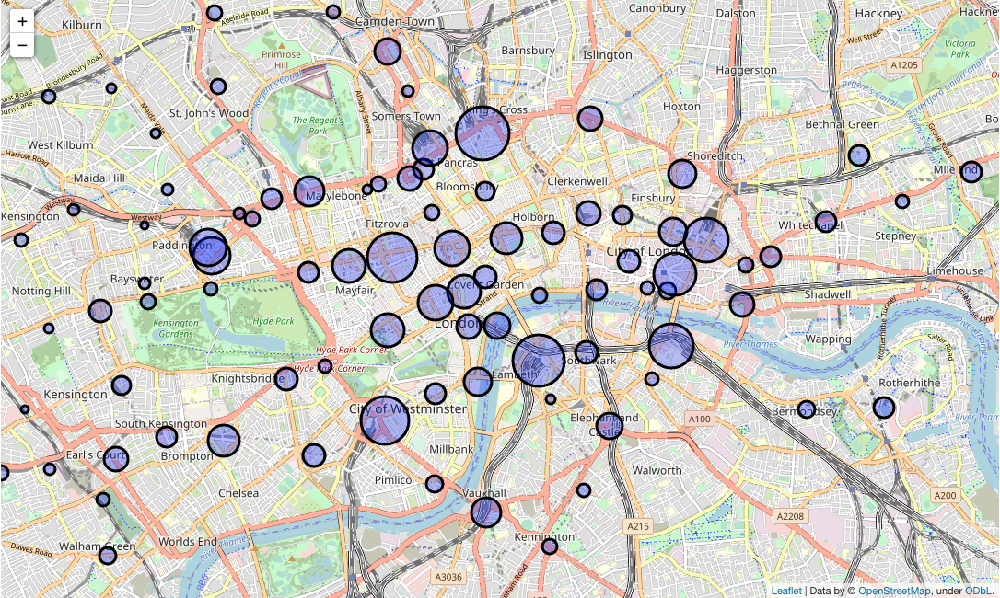

### Folium Map of London with Food venues ###

In [488]:
Lon_4sq_venues[500:505]

,Outcode,Neighbourhood,latitude,longitude,Venue_id,Venue,Venue_latitude,Venue_longitude,Venue_Postcode,Venue_category,Count,Category_Grouping
500,EC2,Bishopsgate,51.5251,-0.0857,4b7bf6abf964a52004762fe3,Veggie Pret,51.524611,-0.081129,EC2A 3QD,Sandwich Place,118.0,Sandwich Place
501,EC2,Bishopsgate,51.5251,-0.0857,57ab3348498e2da27946af85,Sagardi Basque Country Chefs,51.525278,-0.080509,EC2A 3BS,Spanish Restaurant,13.0,Spanish Restaurant
502,EC2,Bishopsgate,51.5251,-0.0857,4fcf5571003957fed8803a9c,Pasta e Basta,51.526316,-0.082963,EC2A 3DT,Food Truck,27.0,"Food Truck, Snack Place"
503,EC2,Bishopsgate,51.5251,-0.0857,4be49382bcef2d7f26c102e5,Corner Savoy Kebab,51.522913,-0.077811,EC2A 3EJ,Middle Eastern Restaurant,65.0,Middle Eastern Restaurant
504,EC2,Bishopsgate,51.5251,-0.0857,56c5b90fcd107873a1529b73,Shoreditch Stop,51.524659,-0.080869,EC2A 3HP,Indian Restaurant,169.0,Indian Restaurant


In [492]:
map_4sq = folium.Map(location=[51.51, -0.12], zoom_start=13)

In [493]:
colors_array = cm.rainbow(np.linspace(0, 1, 20))
rainbow = [colors.rgb2hex(i) for i in colors_array]
dfShading2 = pd.DataFrame(Lon_4sq_venues['Category_Grouping'].value_counts())

In [494]:
# add markers to map
for lat, lng, category, name, pc in zip(Lon_4sq_venues['Venue_latitude'], Lon_4sq_venues['Venue_longitude'], 
                                        Lon_4sq_venues['Category_Grouping'], Lon_4sq_venues['Venue'], Lon_4sq_venues['Outcode']):
    
    label = '{}\n{}\n{}'.format(category, pc, name)
    paintcolor  = rainbow[dfShading2.index.get_loc(category) % 20]
    
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=paintcolor,     #'blue',
        fill=True,
        fill_color=paintcolor,  # fill_color='#3186cc',
        fill_opacity=0.33,
        parse_html=False).add_to(map_4sq)  
    
map_4sq

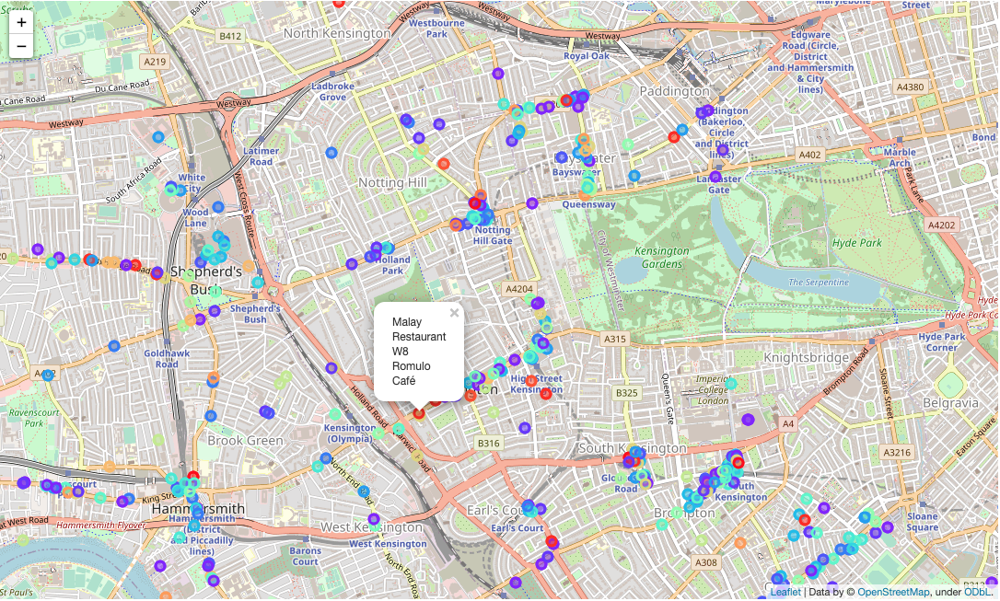

## 5. Results section ##
Here we try to make recommendations for the top 2-3 areas to pick for a new Restaurant<br>
And the top 3 suggestions for a Restaurant *cuisine*


Best Areas to pick for a Restaurant:<br>
1. which have a low density of existing venues
2. which are relatively close to a LUL tube, the bigger the tube entry/exit traffic, the better

In [ ]:
del map_Lon

In [495]:
dfShading = pd.DataFrame(Lon_4sq_venues['Outcode'].value_counts())
dfShading.reset_index(inplace = True)

In [496]:
# Density of venues per postcode (shading) chloropleth map
map_Lon = folium.Map(location=[51.51, -0.10], zoom_start=12)

map_Lon.choropleth(
    geo_data=dPostCodeGJSON,
    data=dfShading,
    columns=['index', 'Outcode'],
    key_on='feature.properties.name',
    fill_color='YlOrRd', nan_fill_color='purple',
    fill_opacity=0.4,
    line_opacity=0.2,
    legend_name='London Postcodes shaded by 4Square venue counts',
)


In [497]:
# add venue markers to map
for lat, lng, category, name, pc in zip(Lon_4sq_venues['Venue_latitude'], Lon_4sq_venues['Venue_longitude'], 
                                        Lon_4sq_venues['Category_Grouping'], Lon_4sq_venues['Venue'], Lon_4sq_venues['Outcode']):
    
    label = '{}\n{}\n{}'.format(category, pc, name)
    
    folium.CircleMarker(
        [lat, lng],
        radius=4,
        popup=label,
        color='red',     #'blue',
        fill=True,
        fill_color='red',  # fill_color='#3186cc',
        fill_opacity=0.33,
        parse_html=False).add_to(map_Lon)  

In [ ]:
map_Lon

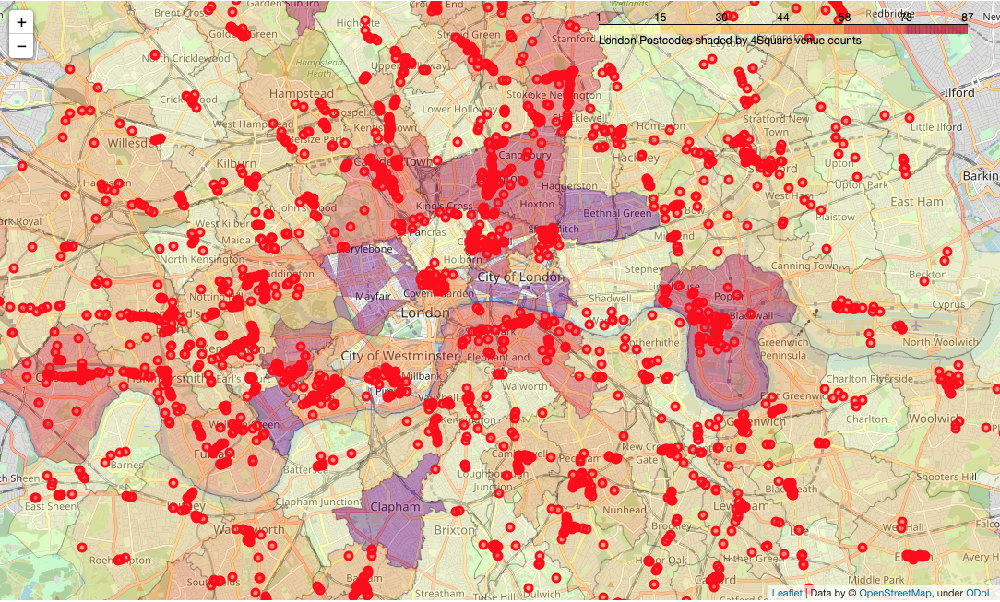

In [499]:
for lat, lng, name, size in zip(pdTFL_tubes['latitude'], pdTFL_tubes['longitude'], pdTFL_tubes['NAME'], pdTFL_tubes['million']):
    label = '{}, {} M'.format(name, np.round(size,2))
    label = folium.Popup(label, parse_html=True)
    
    folium.CircleMarker(
        [lat, lng],
        radius=int(2*np.sqrt(size)), # define how big you want the circle markers to be. 
                                     # I use sq. root to scale bubble area by millions
        popup = label,
        color='black',
        fill=True,
        fill_color='blue',
        fill_opacity=0.3
    ).add_to(map_Lon)


In [ ]:
map_Lon

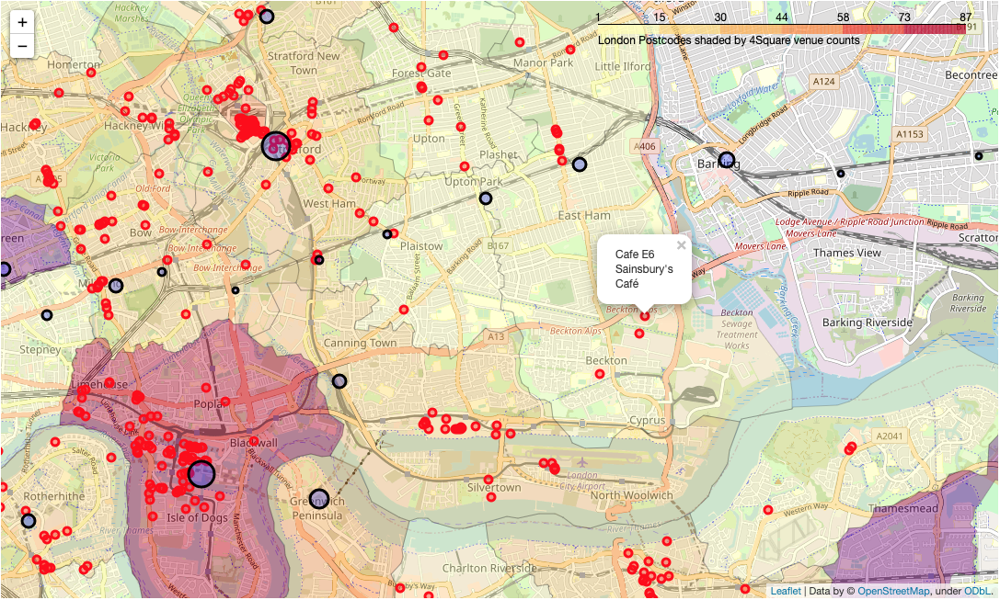

#### Recommendation 1 ####
Based on browsing the above vizualiations and the precedeing value-counts<br>

If biasing or prioritizing more central london / Zone 1 and 2 locations, I would recommend:<br>
* SW5 - Earls' Court
* E1 - East (Whitechapel)
* W10 - North Kensington <br>
sorted by Tube flows (footfall), SW5 highest<br>
<br>
If looking at outer London neighbourhoods, which are more residential and underserved (but have very little footfall) I would recommend:<br>
* E6 - East Ham, Beckton
* E13 - Plaistow
* SE28 - Thamesmead<br>
Sorted by Tuve flows (footfall), with E6 highest<br>

In [500]:
Lon_4sq_venues.groupby('Outcode').count().sort_values('Venue', ascending=False).tail(7)[['Neighbourhood','Category_Grouping']]

,Neighbourhood,Category_Grouping
Outcode,,
N11,5,5
E6,3,3
SE28,3,3
N7,2,2
E13,2,2
SW2,2,2
SE17,1,1


#### Recommendation 2 ####
Based on browsing the above Venue data by category, value-counts (in earlier sections):<br>
* Cuban - Found only 1 in our FourSquare trawl, seriously underserved, and *seriously good*
* Polish - few available, and very large population of Polish emigres. *Bigos, Pierogi*
* Lebanese - already getting quite popular in London.<br>
Vegetarian is also on the *up-and-up* and is a hugely trendy lifestlye choice. But many hosts opening Vegetarian restau.


In [501]:
Lon_4sq_venues[Lon_4sq_venues['Venue_category'].isin(['Cuban Restaurant',
                                                      'Polish Restaurant',
                                                      'Lebanese Restaurant',
                                                      'Vegetarian / Vegan Restaurant'])].groupby(
                                                    'Venue_category').count().sort_values(
                                                    'Venue', ascending = False)[['Neighbourhood','Outcode']]

,Neighbourhood,Outcode
Venue_category,,
Vegetarian / Vegan Restaurant,27,27
Lebanese Restaurant,18,18
Polish Restaurant,6,6
Cuban Restaurant,1,1


In [502]:
# less granular - by Groupings: see Polish
Lon_4sq_venues.groupby('Category_Grouping').count().sort_values('Venue', ascending=False).tail(12)[['Neighbourhood','Outcode']]

,Neighbourhood,Outcode
Category_Grouping,,
Polish Restaurant,6,6
Moroccan Restaurant,6,6
Food Court,6,6
Ethiopian Restaurant,5,5
Irish Pub,4,4
"German, Austrian Restaurant",3,3
Israeli Restaurant,2,2
Poke Place,1,1
Scandinavian Restaurant,1,1


In [503]:
# More granular - and more ideas .... Cajun / Creole?  Scandinavian?  Isreali?  Poke' ...
Lon_4sq_venues.groupby('Venue_category').count().sort_values('Venue', ascending=False).tail(15)[['Neighbourhood','Category_Grouping']]

,Neighbourhood,Category_Grouping
Venue_category,,
Cajun / Creole Restaurant,1,1
Filipino Restaurant,1,1
Southern / Soul Food Restaurant,1,1
Kosher Restaurant,1,1
Soup Place,1,1
Shabu-Shabu Restaurant,1,1
German Restaurant,1,1
Scandinavian Restaurant,1,1
Gluten-free Restaurant,1,1


## 6. Discussion, Conclusion ##



**Restaurants**<br>
As above, recommend to try and open a Cuban or Polish restaurant, based on their scarcity on FourSquare venues data<br>
Recommend to scout out **SW5** postcode or also **E6, E13** in the east

#### Lessons ####

**Project**<br>
Most of the time was spent on Data cleansing and data wrangling.<br>
We scraped data from various data sources, but once I got it, I struggled significantly with quality of the data<br>
particularly that datasets were at different levels of granularity : Post Outcode vs Postcode sector, and the .geojson data has fine-grained breakdown inside the WC and EC postcodes (it breaks them down into many wards). 
1. it was not trivial to cleanup this data (at least, for me)
2. it was not trivial to try and join this data (not having common keys)

**Flaws / Even better if**<br>
1. The Foursquare data I have got, it is limited to 100 venues per call. Therefore we are clipping or losing some of the dataset in the highest density areas.
2. The Foursquare calls which we make, is based on a circular bounding area. Problem is, this does not match postcodes, there are circles which are smaller than their postcode, and others that overlap several postcodes. We fixed this as best as possible with:
    - variable 'radius' calls based roughly on postcode size and
    - post-processing to filter the venues to those which match the postcode (Outcode) in the dataFrame. This is effectively a de-duplication of data 
3. Turns out at the end, that the PostCode data coordinates (lat, long) from pgeocode, were of variable and sometimes poor data quality. By which I mean, they are definately not centroids of the mapping bounding boxes for the postcodes, and in some cases sufficiently off, to degrade my data quality
4. I must try better with .geojson bounding boxes for postcodes (Outcodes) or find a better way.
5. I coudln't join my Customer Expdenditure data (because it was at a finer granularity than Postcode) but more time could be invested here.<br>
To do again, I would keep the scope a little bit simpler, or choose better datasets ;-)

**Recommendation**<br>
I would recommend where possible that people publish datasets with a common granularity of geospatial data, for example a common understanding of Postcode. And that they use a common key. I saw many other location definitions like wards, MSOA, LSOA, other statistical reporting areas.<br>

#### Conclusion ####
This course, and this final project, has been a real interesting learning experience, particularly working with FourSquare venue data, and with Folium maps. <br>
For my use case / problem statement, there wasn't an obvious Machine Learning algo to deploy (like, I'm not doing any clustering or classification, but I have done in other assignments). I focused more on the geo-spatial mapping of FourSquare venues and LUL Tubes<br>
Nevertheless I hope you enjoyed, even if assignment is quite lengthy. If you read this far please let me share an image:
<br>
<br>
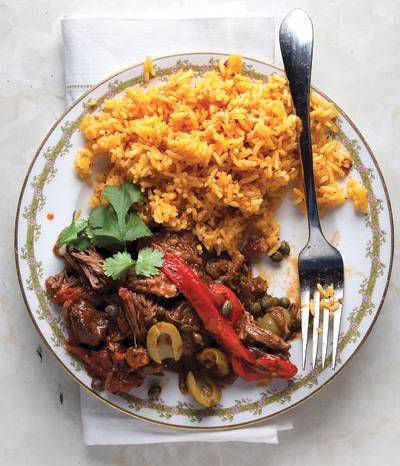<br>
**Ropa Vieja**